# GG4527- Urban Analytics: A Toolkit for Sustainable Urban Development Assignment 1
##  Lab 3: Geovisualization Techniques - Data Viz

-----


### Challenge 1


In [1]:
# code only 

# subset_listing is the cleaned data and the non numeric attributes are 
# neighbourhood_cleansed     object
# property_type              object
# room_type                  object
# price                      object


subset_listings.select_dtypes(include='number') #only including numeric attributes 


NameError: name 'subset_listings' is not defined

screenshot of table 
# 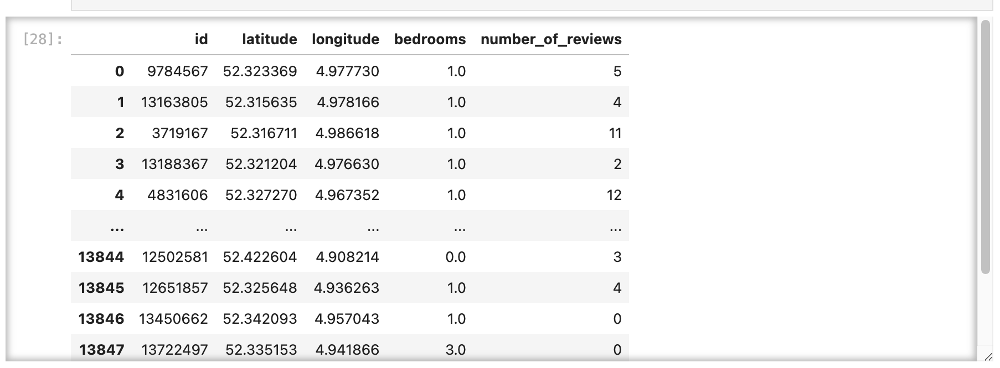



### Challenge 2


In [102]:
# data api taken from https://data.cityofnewyork.us/resource/833y-fsy8.json
# on shootings in New York

import requests
url = 'https://data.cityofnewyork.us/resource/833y-fsy8.json' #set url

response = requests.get(url) # use requests to get data 

df = pd.DataFrame(data)
print(df.head())

# Clean the data (remove missing values, etc.)
df_clean = df.dropna()



  incident_key               occur_date occur_time      boro  \
0    279709792  2023-12-29T00:00:00.000   21:22:00  BROOKLYN   
1    279758069  2023-12-29T00:00:00.000   18:40:00     BRONX   
2    279683077  2023-12-29T00:00:00.000   03:43:00    QUEENS   
3    279609499  2023-12-27T00:00:00.000   19:47:00     BRONX   
4    279547333  2023-12-26T00:00:00.000   23:43:00    QUEENS   

  loc_of_occur_desc precinct jurisdiction_code loc_classfctn_desc  \
0           OUTSIDE       75                 0             STREET   
1           OUTSIDE       40                 0             STREET   
2            INSIDE      113                 0         COMMERCIAL   
3           OUTSIDE       42                 0             STREET   
4           OUTSIDE      106                 0             STREET   

      location_desc  statistical_murder_flag  ... x_coord_cd y_coord_cd  \
0            (null)                    False  ...    1018514     178646   
1            (null)                    False  ... 

In [100]:
df_clean = df.dropna() #removing NaN values

df_clean

,incident_key,occur_date,occur_time,boro,loc_of_occur_desc,precinct,jurisdiction_code,loc_classfctn_desc,location_desc,statistical_murder_flag,...,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi,:@computed_region_f5dn_yrer
0,279709792,2023-12-29T00:00:00.000,21:22:00,BROOKLYN,OUTSIDE,75,0,STREET,(null),False,...,1018514,178646,40.656953,-73.876507,"{'type': 'Point', 'coordinates': [-73.876507, ...",2,25,47,17215,45
1,279758069,2023-12-29T00:00:00.000,18:40:00,BRONX,OUTSIDE,40,0,STREET,(null),False,...,1010564,235262,40.812379,-73.90494,"{'type': 'Point', 'coordinates': [-73.90494, 4...",5,35,23,10933,49
2,279683077,2023-12-29T00:00:00.000,03:43:00,QUEENS,INSIDE,113,0,COMMERCIAL,RESTAURANT/DINER,False,...,1047268,189119,40.685543,-73.772774,"{'type': 'Point', 'coordinates': [-73.772774, ...",3,6,71,24669,41
3,279609499,2023-12-27T00:00:00.000,19:47:00,BRONX,OUTSIDE,42,0,STREET,(null),False,...,1015730,240807,40.82758,-73.886248,"{'type': 'Point', 'coordinates': [-73.886248, ...",5,43,25,10937,34
4,279547333,2023-12-26T00:00:00.000,23:43:00,QUEENS,OUTSIDE,106,0,STREET,(null),True,...,1034904,190307,40.688883,-73.817347,"{'type': 'Point', 'coordinates': [-73.817347, ...",3,46,64,24015,62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,265350047,2023-03-19T00:00:00.000,12:30:00,QUEENS,OUTSIDE,111,0,STREET,(null),False,...,1053802,212617,40.749988,-73.748972,"{'type': 'Point', 'coordinates': [-73.748972, ...",3,16,69,14506,26
995,265339107,2023-03-18T00:00:00.000,15:45:00,MANHATTAN,OUTSIDE,32,0,STREET,(null),False,...,997995,235238,40.812339,-73.950343,"{'type': 'Point', 'coordinates': [-73.950343, ...",4,36,20,12424,18
996,265303127,2023-03-18T00:00:00.000,02:40:00,BROOKLYN,INSIDE,75,2,HOUSING,MULTI DWELL - PUBLIC HOUS,False,...,1012375,181816,40.665678,-73.898617,"{'type': 'Point', 'coordinates': [-73.898617, ...",2,25,47,17214,45
997,265339108,2023-03-18T00:00:00.000,22:05:00,BROOKLYN,OUTSIDE,67,0,STREET,(null),False,...,998750,176748,40.65179719,-73.94774422,"{'type': 'Point', 'coordinates': [-73.94774422...",2,11,40,13510,61


In [87]:
df_clean.columns

Index(['incident_key', 'occur_date', 'occur_time', 'boro', 'loc_of_occur_desc',
       'precinct', 'jurisdiction_code', 'loc_classfctn_desc', 'location_desc',
       'statistical_murder_flag', 'perp_age_group', 'perp_sex', 'perp_race',
       'vic_age_group', 'vic_sex', 'vic_race', 'x_coord_cd', 'y_coord_cd',
       'latitude', 'longitude', 'geocoded_column',
       ':@computed_region_yeji_bk3q', ':@computed_region_92fq_4b7q',
       ':@computed_region_sbqj_enih', ':@computed_region_efsh_h5xi',
       ':@computed_region_f5dn_yrer'],
      dtype='object')

In [105]:
# using folium to map shootings in New York 
import folium
import pandas as pd

m = folium.Map(location=[40.656953, -73.876507], zoom_start=14) # create map

for _, row in df_clean.iterrows(): # this is adding coloured markers to show murders in red
    color = 'red' if row['statistical_murder_flag'] else 'blue'
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=10, color=color, fill=True, fill_color=color).add_to(m)

m #print map 

screenshot of map

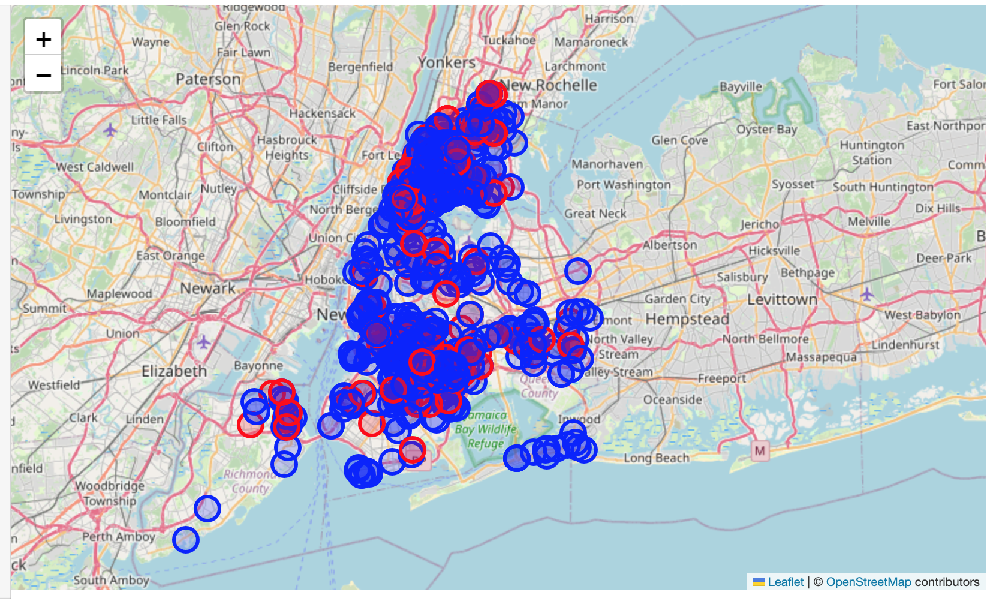

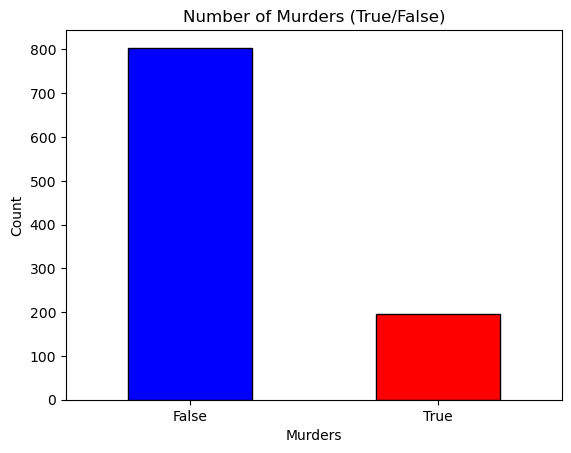

In [132]:
# additional graph to go with map
murders = df['statistical_murder_flag'].value_counts()

# Plotting the bar chart
murders.plot(kind='bar', color=['blue', 'red'], edgecolor='black') #plotting bar graph
plt.title('Number of Murders (True/False)')
plt.xlabel('Murders')
plt.ylabel('Count')
plt.xticks([0, 1], ['False', 'True'], rotation=0)
plt.show()

screenshot
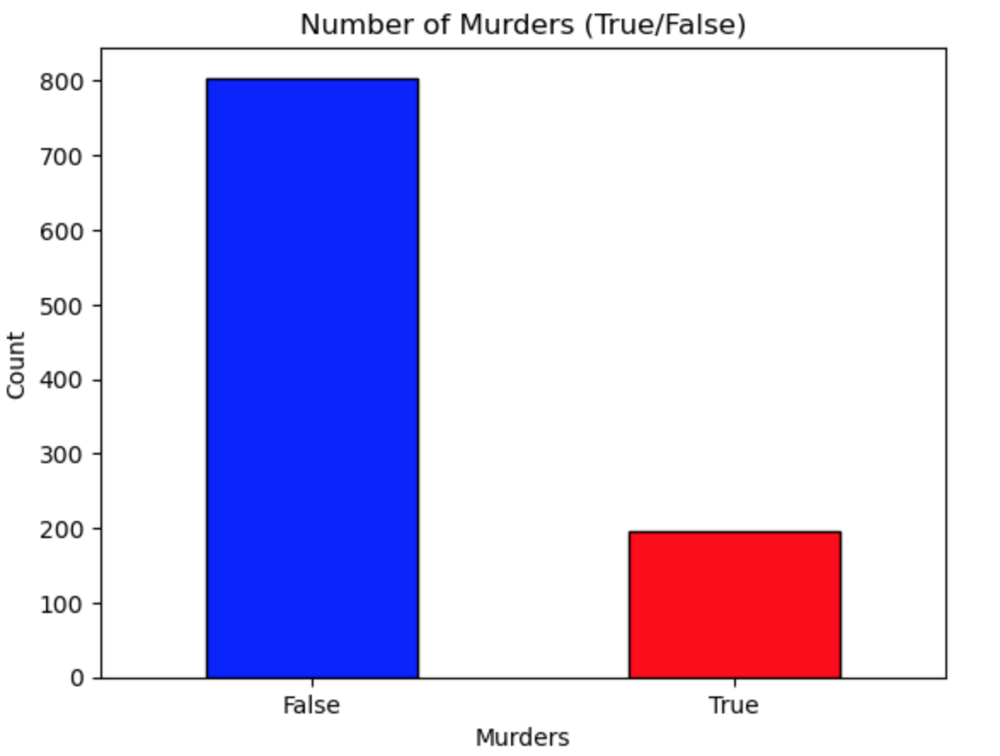

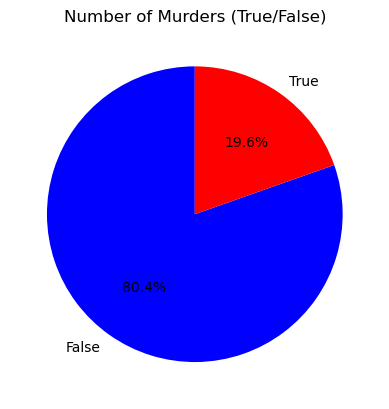

In [134]:
# additional graph to go with map

murders.plot(kind='pie', autopct='%1.1f%%', colors=['blue', 'red'], startangle=90, legend=False) #plotting pie chart
plt.title('Number of Murders (True/False)')
plt.ylabel('') 
plt.show()

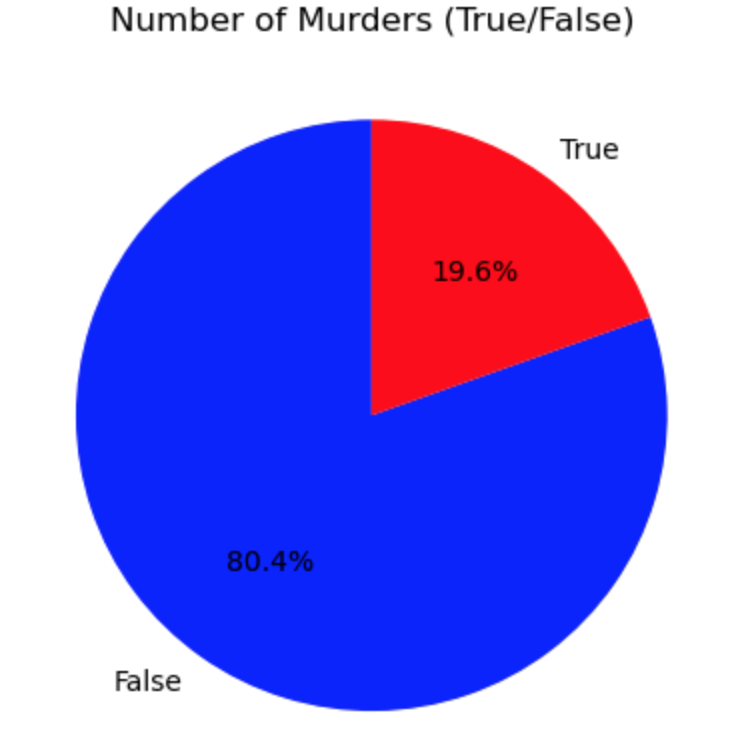

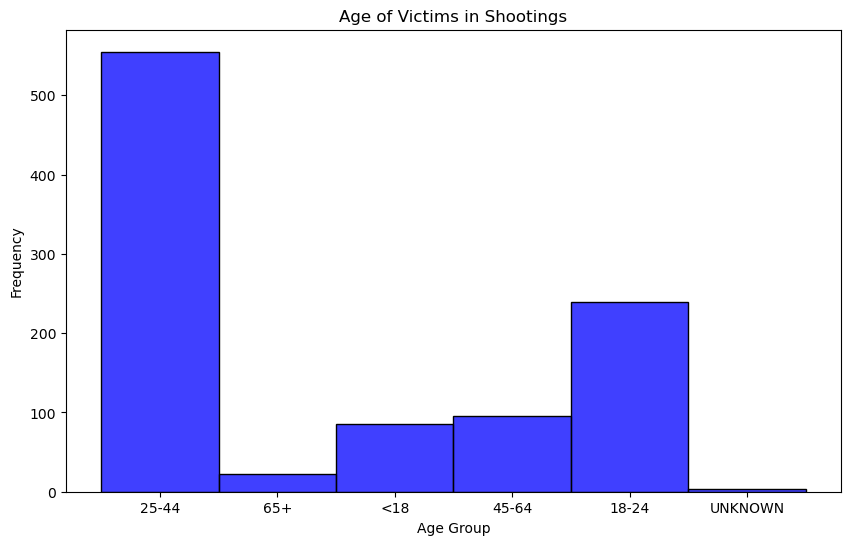

In [114]:
# plot of victim ages (univariate)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

counts = df['vic_age_group'].value_counts() # sets the count of age groups

plt.figure(figsize=(10, 6)) # size 
sns.histplot(df['vic_age_group'], discrete=True, kde=False, color='blue', bins=len(counts))
plt.title('Age of Victims in Shootings')
plt.xlabel('Age Group')
plt.ylabel('Frequency')
plt.show()


screenshot
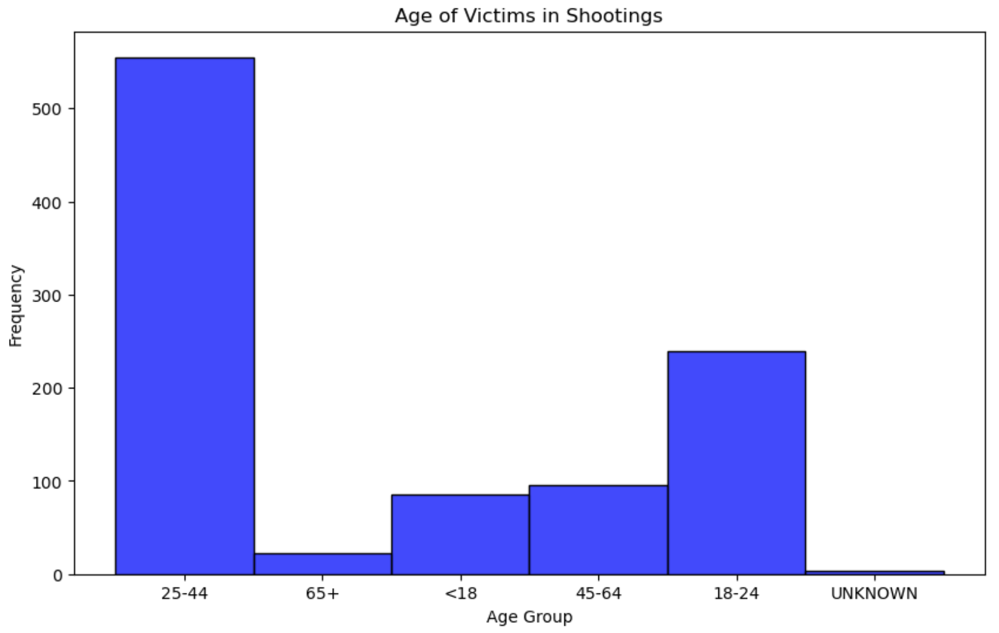

This graph shows us that the main victims are aged between 25 and 44. 

In [118]:
#contingency table between age and sex (multivariate)
contingency_table = pd.crosstab(df_clean['vic_race'], df_clean['vic_sex'])
print(contingency_table)


vic_sex                          F    M  U
vic_race                                  
AMERICAN INDIAN/ALASKAN NATIVE   0    1  0
ASIAN / PACIFIC ISLANDER         3   21  0
BLACK                           70  525  0
BLACK HISPANIC                  12  111  0
UNKNOWN                          0    3  1
WHITE                            4   20  0
WHITE HISPANIC                  23  161  0


screenshot of table
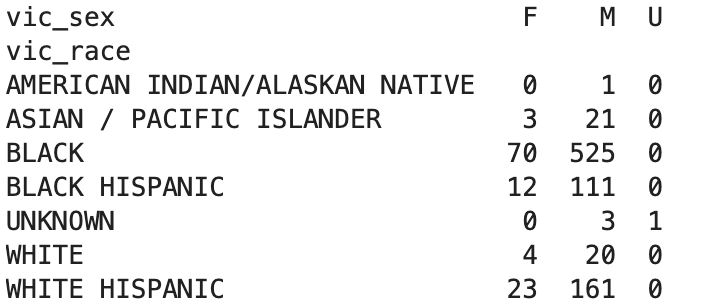

By creating a contingency table between age and sex we can see that the main victims of shootings are black men. It also shows that there are significantly more male victims than female. 

In [ ]:
# data is mainly categorical data so cannot perform descriptive stats such as (mean, std)
# therefor descriptive stats is carried out on precinct 

In [127]:
describe = df['precinct'].describe()
print(describe)

mode_precinct = df['precinct'].mode()[0]
print(f"Mode of precinct: {mode_precinct}") # most common precinct

precinct_counts = df['precinct'].value_counts()
print(f"Precinct counts:\n{precinct_counts}") # frequency of each precinct

# this shows that precint 46 has the most shootings at 63 reports

count     1000
unique      71
top         46
freq        63
Name: precinct, dtype: object
Mode of precinct: 46
Precinct counts:
precinct
46     63
75     56
47     48
44     45
73     41
       ..
94      1
20      1
62      1
10      1
111     1
Name: count, Length: 71, dtype: int64
Number of unique precincts: 71


if there was a continuous attribute like age this is the code I would use to work out descriptive stas:

print(df.describe(['age']))

mean_age = df['age'].mean()
median_age = df['age'].median()
std_age = df['age'].std()

print(mean_age, median_age, std_age)

### Challenge 3


In [3]:
import requests

url = "https://data.cityofnewyork.us/resource/h9gi-nx95.json" # set url

response = requests.get(url) # use requests to get data

In [15]:
print(df[['latitude', 'longitude']].isnull().sum()) # checking for nan values
cleaned = df.dropna(subset=['latitude', 'longitude']) # removing nan values
    
print(cleaned.head())

latitude     85
longitude    85
dtype: int64
                 crash_date crash_time              on_street_name  \
2   2023-11-01T00:00:00.000       1:29               OCEAN PARKWAY   
9   2021-09-11T00:00:00.000       9:35                         NaN   
10  2021-12-14T00:00:00.000       8:13             SARATOGA AVENUE   
12  2021-12-14T00:00:00.000      17:05  BROOKLYN QUEENS EXPRESSWAY   
13  2021-12-14T00:00:00.000       8:17                         NaN   

   off_street_name number_of_persons_injured number_of_persons_killed  \
2         AVENUE K                         1                        0   
9              NaN                         0                        0   
10  DECATUR STREET                         0                        0   
12             NaN                         0                        0   
13             NaN                         2                        0   

   number_of_pedestrians_injured number_of_pedestrians_killed  \
2                             

Screenshot of map

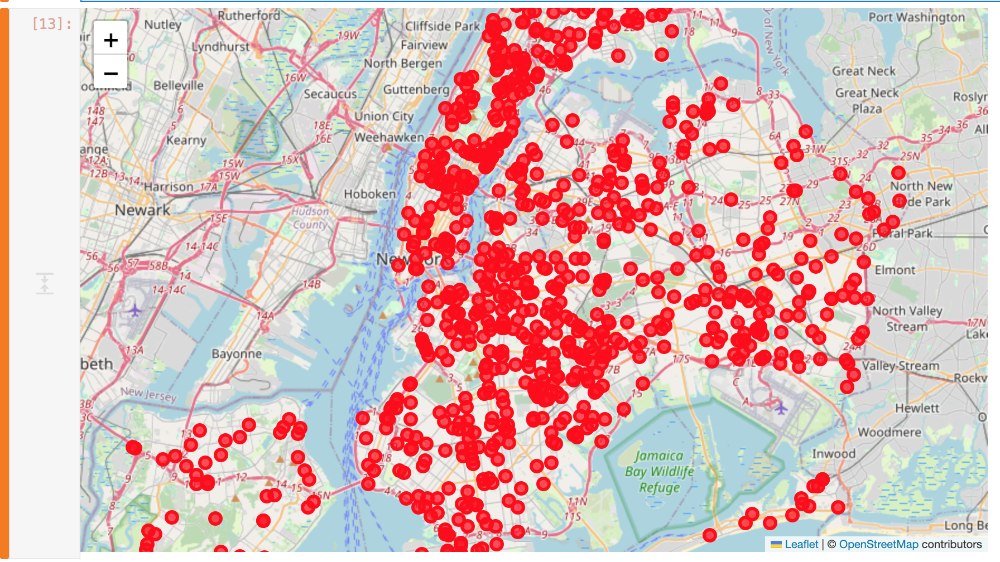

In [31]:
# stats 

cleaned.loc[:, 'number_of_persons_killed'] = pd.to_numeric(cleaned['number_of_persons_killed'], errors='coerce')
cleaned.loc[:, 'number_of_cyclist_killed'] = pd.to_numeric(cleaned['number_of_cyclist_killed'], errors='coerce')
# ensuring all the data is numerical to ensure stats are calculated 
# using .loc to indicate to avoid copyright warning

stats_person = cleaned['number_of_persons_killed'].describe() # using .describe to get stats 
stats_cyclist = cleaned['number_of_cyclist_killed'].describe()


In [30]:
print(stats_person)

count    915.000000
mean       0.003279
std        0.057197
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        1.000000
Name: number_of_persons_killed, dtype: float64


In [32]:
print(stats_cyclist)

count    915.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: number_of_cyclist_killed, dtype: float64


Both statistics for the number of people and cyclists killed are very low. There could be a few reasons for this. First is that there is just a low number of people and cyclists being killed within the time frame of the data. However, if this is not actually the case there could be issue with data quality or missing data. For example, if there is a lot of NaN values, to repsent missing data, then this would get changed to 0, showing no people/cyclists killed.

This data, if computed successfully, can be incredibly useful in highlighting traffic issues for pedistrians and cyclists around the area of New York. It can aid governement bodies in deciding problem areas that are dangerous for people and cyclists by prioritising hot spots. The data also highlights how people and cyclists can be affected differently. The min/max will indicate what the highest and lowests deaths are. If these are strikingly different it would show that there is significant issue within that area and can be prioritised when deciding on implemnting safety features. The quantiles show the distribution of data which can be useful if the data is skewed. This is because the 50% quantile is often more useful than the mean when the data is skewed. This is because the mean is sensitive to outliers so a singular problem area may not represent that data accurately. The graphs below show a histogram and boxplot of the people killed and cyclists killed. This would be more useful with more varying results as the distribution is very small. In addition to histograms and box plots, heatmaps and scatterplots could be used.

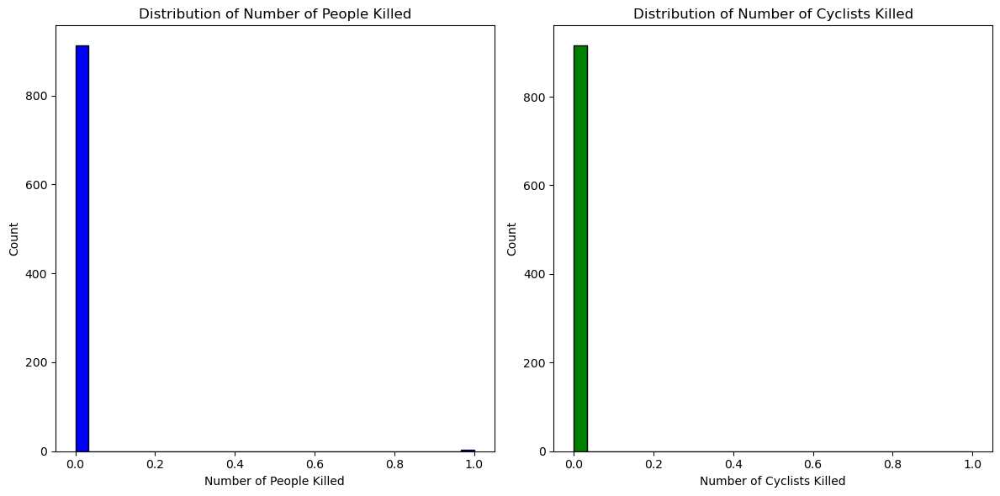

In [44]:
# graph plotting 
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6)) # figure size

# people
plt.subplot(1, 2, 1) #defining position 
plt.hist(cleaned['number_of_persons_killed'], bins=30, color='blue', edgecolor='black')
plt.title('Distribution of Number of People Killed')
plt.xlabel('Number of People Killed')
plt.ylabel('Count')

# cyclist
plt.subplot(1, 2, 2) # defining position
plt.hist(cleaned['number_of_cyclist_killed'], bins=30, color='green', edgecolor='black', range=(0, 1)) #the range needs to be added here because there are no deaths so it would start at a negative number (there are no negative deaths)
plt.title('Distribution of Number of Cyclists Killed')
plt.xlabel('Number of Cyclists Killed')
plt.ylabel('Count')

plt.tight_layout()
plt.show()


Screenshot of graph 
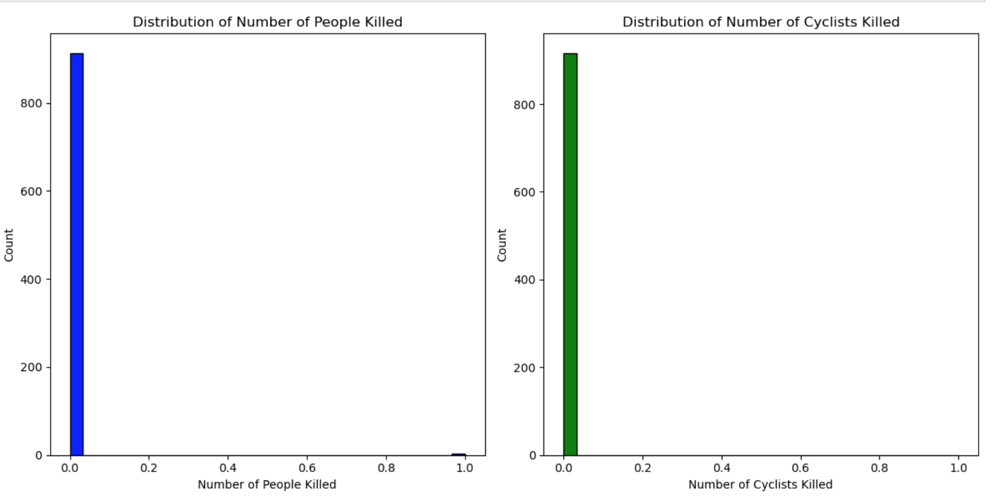


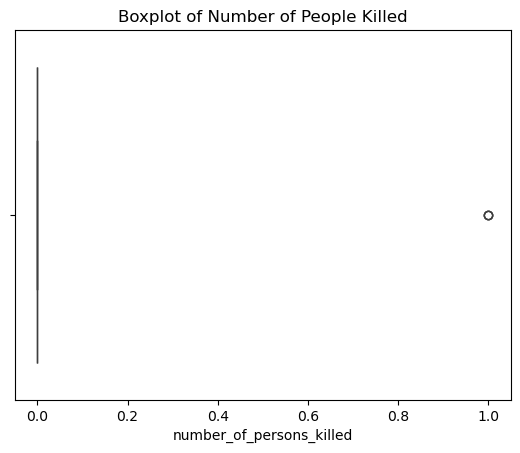

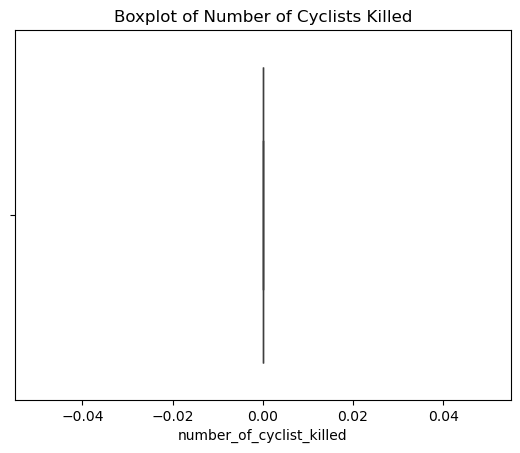

<Figure size 640x480 with 0 Axes>

In [52]:
#box plots

import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x=cleaned['number_of_persons_killed'])
plt.title('Boxplot of Number of People Killed')
plt.show()

sns.boxplot(x=cleaned['number_of_cyclist_killed'])
plt.title('Boxplot of Number of Cyclists Killed')
plt.show()

plt.tight_layout()
plt.show()

#(Seaborn, 2023)

Screenshot of box plots

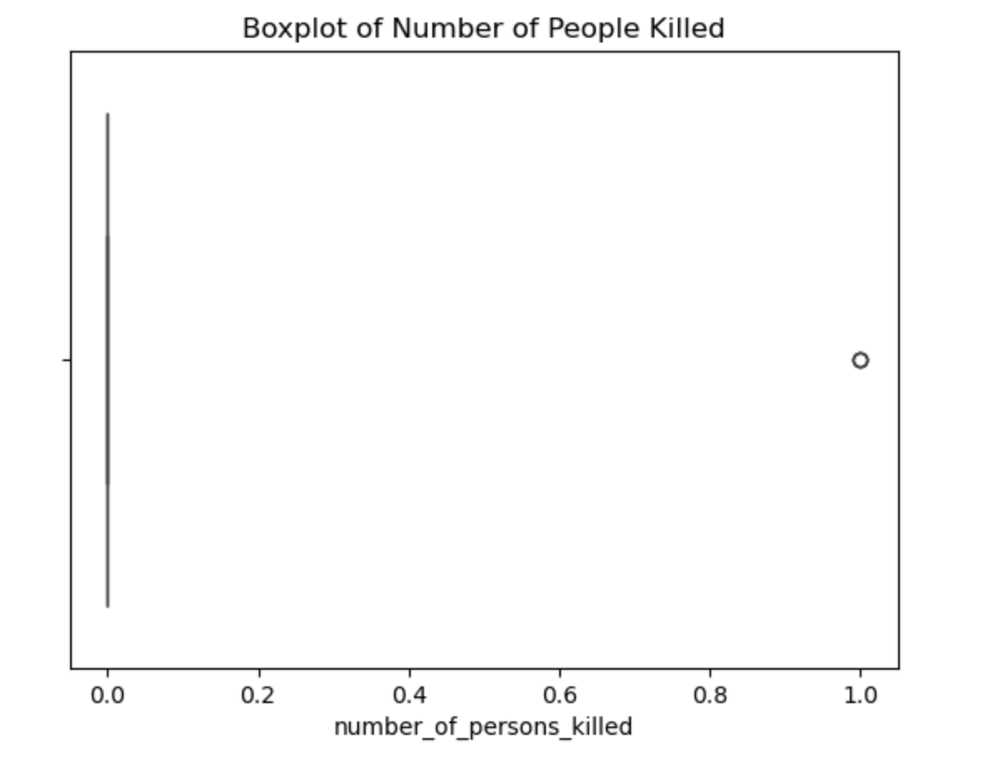

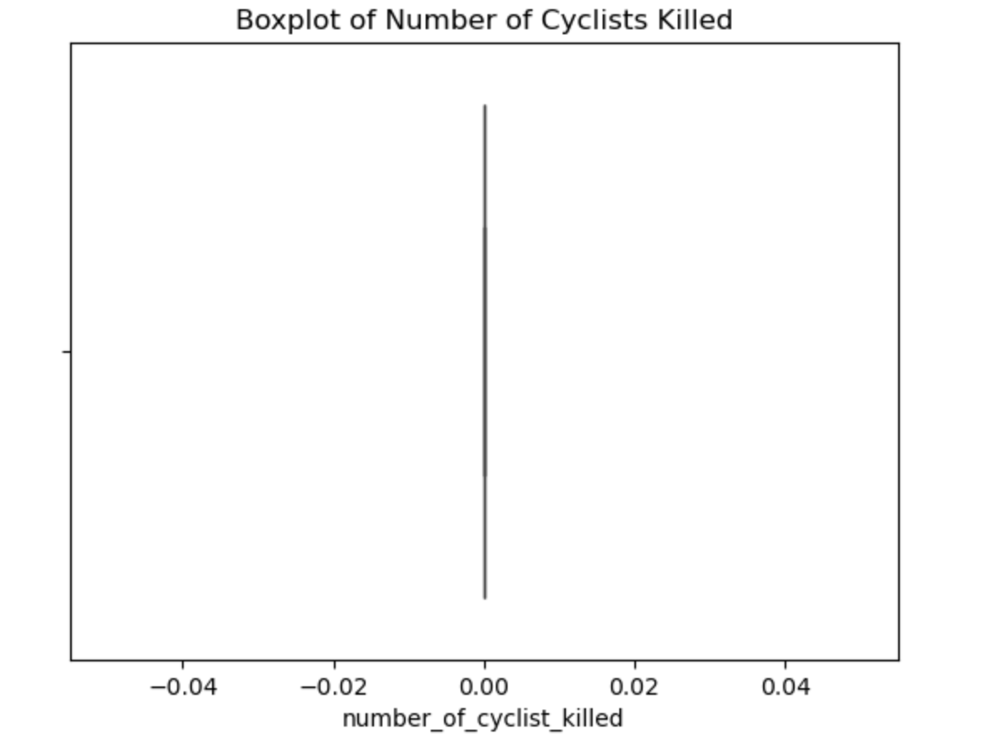

### Challenge 4


1. Both longboard ad datashader were powerful when using big data. However, I prefered working with datashader as it was easier to follow knowing the five step pipeline. In addition to this datashader was much faster in calculating the code. Moreover, a lot of the data I have worked with in my GIS acadmics has mainly focused on geographically distrubuted data which is better suited with datashader than longboard and produces very attractive interactive maps. For this reason I would say that datashader has more exciting functions. However, longboard also provides interactive maps but I feel is better suited for time series data but found the function of viz(gdf) useful for exploring data.

2/3. I have decided to chose data taken from covid-19 (https://github.com/CSSEGISandData/COVID-19). At the begining of the pandemic it was important to map the data to show areas that had high levels of infection and understand how the virus was spreading. 

In [55]:
import pandas as pd

# Load COVID-19 dataset (CSV format in this case)
covid_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')

# Check the first few rows
covid_data.head()


,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,209322,209340,209358,209362,209369,209390,209406,209436,209451,209451
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,334391,334408,334408,334427,334427,334427,334427,334427,334443,334457
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,271441,271448,271463,271469,271469,271477,271477,271490,271494,271496
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,47866,47875,47875,47875,47875,47875,47875,47875,47890,47890
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,105255,105277,105277,105277,105277,105277,105277,105277,105288,105288


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
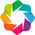

In [56]:
import holoviews as hv, pandas as pd, colorcet as cc
from holoviews.element.tiles import EsriImagery
from holoviews.operation.datashader import datashade
hv.extension('bokeh')

In [71]:
import datashader as ds
import datashader.transfer_functions as tf
from holoviews.operation.datashader import rasterize
import hvplot.pandas

canvas = ds.Canvas(plot_width=900, plot_height=480) #projection

canvas.points(covid_data, 'Long', 'Lat', agg=ds.count()) #aggregation

import numpy as np
np.power(canvas.points(covid_data, 'Long', 'Lat', agg=ds.count()),2) #transformation 

<xarray.DataArray (Lat: 480, Long: 900)> Size: 2MB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint32)
Coordinates:
  * Long     (Long) float64 7kB -177.9 -177.5 -177.1 ... 177.1 177.5 177.9
  * Lat      (Lat) float64 4kB -71.8 -71.5 -71.2 -70.9 ... 70.96 71.26 71.56
Attributes:
    x_range:  (-178.1165, 178.065)
    y_range:  (-71.9499, 71.7069)

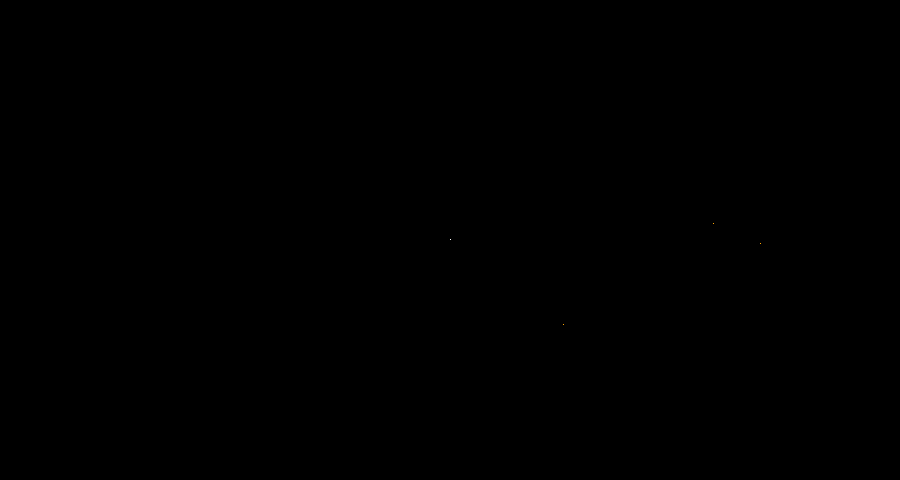

In [63]:
import datashader.transfer_functions as tf
tf.set_background(
    tf.shade(
        canvas.points(covid_data, 'Long', 'Lat', agg=ds.count()),
        cmap=cc.fire),
    'black') # clolour mapping 

In [70]:
map_tiles = EsriImagery().opts(alpha=0.5, width=900, height=480, bgcolor='black')
plot = covid_data.hvplot(
    'Long',
    'Lat',
    kind='scatter',
    rasterize=True,
    cmap=cc.fire,
    cnorm='eq_hist'
)
map_tiles * plot # embedding?

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [Long,Lat]   (Count)

Screenshot of map
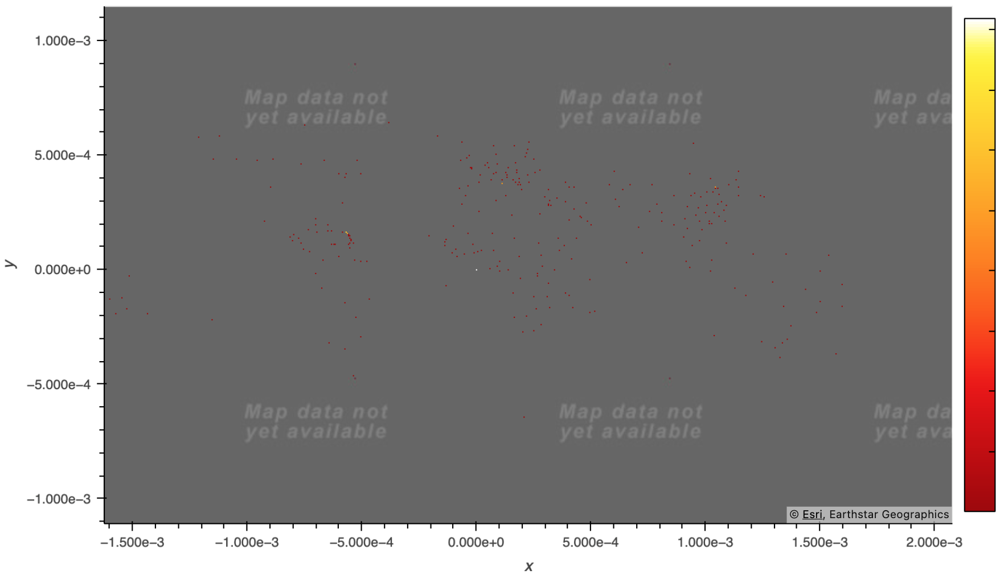

I had several issues with this challenge. The main issue I have encountered is an empty array which has resulted in NaN values. I tried changing the aggregation paramter serval times but continued to get the same outcome. I also had issues with embedding the data and tried a few different methods that also didn't work. However, this may have been solved is aggregation was completed correctly. I am also unsure as to why the map is not available. The data that I have contains correct geometry points as coordinates ('long' and 'lat') and the crs is correct. 

Referances:

Seaborn. (2023). Seaborn Documentation: boxplot. Available at: https://seaborn.pydata.org/generated/seaborn.boxplot.html (Accessed: 25 February 2025).
